In [11]:
# GPU: w Colab wybierz Runtime → Change runtime type → GPU (T4/L4)

!pip install -q "torch>=2.3" "accelerate>=0.34" "transformers>=4.43" sentence-transformers chromadb
!pip install -q git+https://github.com/openai/whisper.git
!pip install -q pillow pdf2image
!sudo apt-get -y install poppler-utils  # dla pdf2image (opcjonalnie)
!pip install -U bitsandbytes


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
poppler-utils is already the newest version (22.02.0-2ubuntu0.10).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.


getNodeByIdOrMessageId - no node found by id: placeholder-request-68d2ec58-529c-8329-ac34-d4036dd9a0f1-1

In [1]:
import hashlib

def sha256_of_file(path, chunk=1<<20):
    h = hashlib.sha256()
    with open(path, "rb") as f:
        while True:
            b = f.read(chunk)
            if not b: break
            h.update(b)
    return h.hexdigest()

def text_id_from_content(content: str) -> str:
    return "text::" + hashlib.sha256(content.encode("utf-8")).hexdigest()

def image_id_from_path(path: str) -> str:
    # ID po zawartości pliku (nie po nazwie), więc ten sam obraz nie doda się drugi raz
    return "image::" + sha256_of_file(path)

def add_unique(collection, ids, embeddings, documents, metadatas) -> int:
    """Dodaj tylko te rekordy, których ID jeszcze nie ma w kolekcji."""
    if not ids:
        return 0
    # pobierz istniejące (po samych ID)
    existing_ids = set(collection.get(ids=ids)["ids"])
    add_idx = [i for i,_id in enumerate(ids) if _id not in existing_ids]
    if add_idx:
        collection.add(
            ids=[ids[i] for i in add_idx],
            embeddings=[embeddings[i] for i in add_idx],
            documents=[documents[i] for i in add_idx],
            metadatas=[metadatas[i] for i in add_idx],
        )
    return len(add_idx)


In [2]:
# ====== Imports & setup ======
import os, glob, json, torch
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import chromadb
from chromadb.config import Settings
from sentence_transformers import SentenceTransformer
from transformers import AutoProcessor, AutoModelForCausalLM
from pathlib import Path  # << PATCH: będziemy filtrować pliki po rozszerzeniach

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)


# Ścieżki na dane
BASE = "./data"
IMG_DIR = f"{BASE}/images/train"
TXT_DIR = f"{BASE}/texts"
os.makedirs(IMG_DIR, exist_ok=True)
os.makedirs(TXT_DIR, exist_ok=True)

# ====== Dane przykładowe (wrzuć swoje pliki do /content/data/images oraz /content/data/texts) ======
# jeśli nie masz obrazów, stworzymy jeden testowy "syntetyczny"
img_path = f"{IMG_DIR}/cat.jpg"
if not os.path.exists(img_path):
    img = Image.new("RGB", (512, 384), (230, 240, 255))
    d = ImageDraw.Draw(img)
    d.text((20, 20), "Photo of a white cat on green grass", fill=(10, 20, 60))
    img.save(img_path)

# jeśli nie masz tekstów, stworzymy dwa pliki
#txt1 = f"{TXT_DIR}/faq_1.txt"
#txt2 = f"{TXT_DIR}/faq_2.txt"
# if not os.path.exists(txt1):
#     with open(txt1, "w") as f:
#         f.write("Kot domowy to gatunek ssaka drapieżnego z rodziny kotowatych. Lubi trawę i słońce.")
# if not os.path.exists(txt2):
#     with open(txt2, "w") as f:
#         f.write("Qwen-VL to model Vision-Language, który potrafi łączyć obraz i tekst w odpowiedziach.")

# ====== Modele embeddingów ======
# Tekst: lekki, szybki
text_embedder = SentenceTransformer("sentence-transformers/all-MiniLM-L6-v2", device=DEVICE)
# Obraz: CLIP (wersja sentence-transformers; potrafi encode() na obrazach PIL)
image_embedder = SentenceTransformer("clip-ViT-B-32", device=DEVICE)

def embed_texts(texts):
    vecs = text_embedder.encode(texts, convert_to_numpy=True, normalize_embeddings=True, show_progress_bar=False)
    return vecs

# ====== PATCH: bezpieczne wczytywanie obrazów + filtr rozszerzeń ======
IMG_EXTS = {".png", ".jpg", ".jpeg", ".webp", ".bmp", ".gif"}

def embed_images(paths):
    loaded_images = []
    kept_paths = []
    for p in paths:
        try:
            with Image.open(p) as im:
                loaded_images.append(im.convert("RGB").copy())
                kept_paths.append(p)
        except Exception as e:
            # Nie przerywaj — pomiń plik, który nie jest obrazem (np. _annotations.coco.json)
            print(f"[pomijam] {p}: {e}")

    if not loaded_images:
        dim = image_embedder.get_sentence_embedding_dimension()
        return np.zeros((0, dim)), []

    vecs = image_embedder.encode(
        loaded_images,
        convert_to_numpy=True,
        normalize_embeddings=True,
        show_progress_bar=False
    )
    return vecs, kept_paths
# ====== /PATCH ======


# ====== Budowa wektorówek (dwie kolekcje) ======
PERSIST_DIR = f"{BASE}/chroma"
client = chromadb.PersistentClient(path=PERSIST_DIR)

#client = chromadb.Client(Settings(anonymized_telemetry=False))
col_text  = client.get_or_create_collection(name="mmrag_text",  metadata={"hnsw:space": "cosine","dim":384,"embedder":"all-MiniLM-L6-v2"})
col_image = client.get_or_create_collection(name="mmrag_image", metadata={"hnsw:space": "cosine","dim":512,"embedder":"clip-ViT-B-32"})

# --- ŚCIEŻKI DANYCH (tuż po utworzeniu col_text/col_image) ---
IMG_EXTS = {".png", ".jpg", ".jpeg", ".webp", ".bmp", ".gif"}
image_paths = [str(p) for p in Path(IMG_DIR).rglob("*") if p.suffix.lower() in IMG_EXTS]
text_paths  = [str(p) for p in Path(TXT_DIR).glob("*.txt")]

print(f"Znaleziono {len(image_paths)} obrazów i {len(text_paths)} tekstów")

# --- Dodaj TEXT (dedup + unikamy re-embedowania) ---
text_items = []  # (id, content, path)
for p in text_paths:
    with open(p, "r", encoding="utf-8") as f:
        content = f.read()
    tid = text_id_from_content(content)  # stabilne ID po treści
    text_items.append((tid, content, p))

# Sprawdź, które ID już są w kolekcji
to_check_ids = [tid for tid,_,_ in text_items]
existing = set(col_text.get(ids=to_check_ids)["ids"]) if to_check_ids else set()

# Zostaw tylko nowe do embedowania i dodania
new_items = [(tid, content, p) for (tid, content, p) in text_items if tid not in existing]

if new_items:
    new_docs = [c for _,c,_ in new_items]
    new_ids  = [i for i,_,_ in new_items]
    new_meta = [{"type":"text", "path": p} for _,_,p in new_items]

    txt_vecs = text_embedder.encode(new_docs, convert_to_numpy=True, normalize_embeddings=True, show_progress_bar=False)
    added = add_unique(col_text, new_ids, txt_vecs.tolist(), new_docs, new_meta)
    print(f"[TEXT] Dodano: {added}, pominięto (duplikaty): {len(new_items)-added}")
else:
    print("[TEXT] Brak nowych dokumentów do dodania.")


# --- Dodaj IMAGE ---
# --- Dodaj IMAGE (dedup + unikamy re-embedowania) ---
# Najpierw nadajemy ID po zawartości pliku, zanim zaczniemy embedować
img_items = []  # (id, path)
for p in image_paths:
    try:
        iid = image_id_from_path(p)  # sha256 pliku
        img_items.append((iid, p))
    except Exception as e:
        print(f"[pomijam-hash] {p}: {e}")

to_check_img_ids = [iid for iid,_ in img_items]
existing_img = set(col_image.get(ids=to_check_img_ids)["ids"]) if to_check_img_ids else set()

new_img_paths = [p for (iid,p) in img_items if iid not in existing_img]
if new_img_paths:
    # bezpieczne ładowanie obrazów
    loaded_images, kept_paths = [], []
    for p in new_img_paths:
        try:
            with Image.open(p) as im:
                loaded_images.append(im.convert("RGB").copy())
                kept_paths.append(p)
        except Exception as e:
            print(f"[pomijam-open] {p}: {e}")

    if kept_paths:
        img_vecs = image_embedder.encode(
            loaded_images,
            convert_to_numpy=True,
            normalize_embeddings=True,
            show_progress_bar=False
        )
        # ID muszą odpowiadać kept_paths
        kept_ids  = [image_id_from_path(p) for p in kept_paths]
        img_docs  = [f"[IMAGE] {Path(p).name}" for p in kept_paths]
        img_meta  = [{"type":"image", "path": p} for p in kept_paths]

        added = add_unique(col_image, kept_ids, img_vecs.tolist(), img_docs, img_meta)
        print(f"[IMAGE] Dodano: {added}, pominięto (duplikaty): {len(kept_paths)-added}")
    else:
        print("[IMAGE] Brak obrazów do embedowania po filtrze.")
else:
    print("[IMAGE] Brak nowych obrazów do dodania.")


print("Indexed:", "texts:", col_text.count(), "| images:", col_image.count())




g:\Users\alkai\anaconda3\envs\Multimodal_RAG\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: cuda


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Znaleziono 43 obrazów i 2 tekstów
[TEXT] Dodano: 2, pominięto (duplikaty): 0
[IMAGE] Dodano: 43, pominięto (duplikaty): 0
Indexed: texts: 2 | images: 43


In [2]:
import sys, torch, torchvision, torchaudio, transformers, sentence_transformers
print("python:", sys.executable)
print("torch:", torch.__version__)
print("torchvision:", torchvision.__version__)
print("torchaudio:", torchaudio.__version__)
print("transformers:", transformers.__version__)
print("sentence_transformers:", sentence_transformers.__version__)

python: g:\Users\alkai\anaconda3\envs\Multimodal_RAG\python.exe
torch: 2.5.1+cu121
torchvision: 0.20.1+cu121
torchaudio: 2.5.1+cu121
transformers: 4.56.2
sentence_transformers: 5.1.1


In [1]:
import torch
from sentence_transformers import SentenceTransformer

print("torch", torch.__version__)
m = SentenceTransformer("sentence-transformers/all-MiniLM-L6-v2")
emb = m.encode(["test"], normalize_embeddings=True)
print("OK, embedding shape:", emb.shape)


g:\Users\alkai\anaconda3\envs\Multimodal_RAG\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


torch 2.5.1+cu121


g:\Users\alkai\anaconda3\envs\Multimodal_RAG\lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\alkai\.cache\huggingface\hub\models--sentence-transformers--all-MiniLM-L6-v2. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Fall

OK, embedding shape: (1, 384)


In [9]:
import sys, transformers, sentence_transformers, inspect, torch
print("python:", sys.executable)
print("transformers:", transformers.__version__, "->", inspect.getfile(transformers))
print("sentence_transformers:", sentence_transformers.__version__, "->", inspect.getfile(sentence_transformers))
print("torch:", torch.__version__)


ImportError: cannot import name 'PreTrainedModel' from 'transformers' (g:\Users\alkai\anaconda3\envs\Multimodal_RAG\lib\site-packages\transformers\__init__.py)

In [6]:
print("Indexed now → texts:", col_text.count(), "| images:", col_image.count())


Indexed now → texts: 2 | images: 43


In [3]:
# === IMAGE CAPTIONING (Qwen2.5-VL) -> dopisuje captiony do kolekcji tekstowej ===
# Uruchom po zindeksowaniu obrazów (zmienna kept_paths), przed Query & retrieval

import os, json, torch, gc, re
from pathlib import Path
from PIL import Image
from transformers import AutoProcessor, AutoModelForVision2Seq

# Opcjonalnie: mniejsza fragmentacja pamięci GPU
os.environ.setdefault("PYTORCH_CUDA_ALLOC_CONF", "expandable_segments:True")

# --- Konfiguracja / ścieżki ---
model_id   = "Qwen/Qwen2.5-VL-3B-Instruct"
capt_cache = f"{BASE}/captions.json"   # np. .../data/captions.json

# Limit rozmiaru obrazu (dłuższy bok)
MAX_SIDE = 1024

# --- Wczytaj cache captionów (jeśli istnieje) ---
captions = {}
if os.path.exists(capt_cache):
    with open(capt_cache, "r", encoding="utf-8") as f:
        captions = json.load(f)

# --- Załaduj processor i model (UWAGA: trust_remote_code=True dla Qwen2.5-VL) ---
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)
vlm = AutoModelForVision2Seq.from_pretrained(
    model_id,
    torch_dtype="auto",
    device_map="auto",
    trust_remote_code=True,
)

# --- Helpery ---
def open_and_maybe_resize(path: str, max_side: int = MAX_SIDE) -> Image.Image:
    """Otwiera obraz i jeśli któryś z boków > max_side, skaluje go z zachowaniem proporcji."""
    with Image.open(path) as im:
        im = im.convert("RGB")
        w, h = im.size
        longer = max(w, h)
        if longer > max_side:
            scale = max_side / float(longer)
            new_w, new_h = int(w * scale), int(h * scale)
            im = im.resize((new_w, new_h), resample=Image.LANCZOS)
        return im

def extract_assistant_only(text: str) -> str:
    """Zwróć czystą odpowiedź asystenta (bez 'system'/'user', bez codefence'ów)."""
    if not text:
        return ""
    m = re.search(r'(?ims)\bassistant\s*\n(.*)$', text)  # to, co po 'assistant'
    out = (m.group(1) if m else text)
    # usuń ewentualne nagłówki ról na początku linii
    out = re.sub(r'(?im)^(system|user)\s*$\n?', '', out).strip()
    # usuń codefence’y
    out = re.sub(r'^\s*```(?:\w+)?\s*', '', out)
    out = re.sub(r'\s*```\s*$', '', out)
    # normalizacja spacji
    out = " ".join(out.split())
    return out

# --- Persona eksperta BHP + kontrola generacji ---
SYSTEM_PROMPT = (
    "You are a safety expert on construction sites. Evaluate images in terms of safety, risk, and working conditions. Respond concisely, in English."
)

def qwen_vl_caption(
    image: Image.Image,
    user_prompt: str,
    max_new_tokens: int = 160,
    temperature: float = 0.2,
    top_p: float = 0.9,
    repetition_penalty: float = 1.05,
) -> str:
    messages = [
        {"role": "system", "content": [{"type": "text", "text": SYSTEM_PROMPT}]},
        {"role": "user",   "content": [{"type": "image", "image": image},
                                       {"type": "text",  "text": user_prompt}]},
    ]
    chat_text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    inputs = processor(text=[chat_text], images=[image], return_tensors="pt").to(vlm.device)
    with torch.no_grad():
        out = vlm.generate(
            **inputs,
            max_new_tokens=max_new_tokens,
            temperature=temperature,
            top_p=top_p,
            repetition_penalty=repetition_penalty,
        )
    return processor.batch_decode(out, skip_special_tokens=True)[0].strip()

# --- Wybór źródła obrazów do captioningu ---
sources = kept_paths if "kept_paths" in globals() and kept_paths else image_paths

# --- Wygeneruj captiony tylko dla brakujących ---
todo = [p for p in sources if f"caption::{Path(p).name}" not in captions]
print(f"Captioning dla {len(todo)} obrazów...")

new_caps = {}
for p in todo:
    image = None
    try:
        image = open_and_maybe_resize(p, MAX_SIDE)
        prompt = (
            "First, briefly describe in one sentence what is in the image. Then, answer clearly (yes/no) for two items:"
            "- dangerous situation: yes/no"
            "- bad weather conditions: yes/no"
            "Keep the order and be concise."
        )
        cap_raw = qwen_vl_caption(image, prompt, max_new_tokens=160)
        cap = extract_assistant_only(cap_raw)   # <<--- KLUCZOWA LINIA: zapisujemy tylko odpowiedź asystenta
        key = f"caption::{Path(p).name}"
        new_caps[key] = {"text": cap, "path": p}
        print(f"  ✓ {Path(p).name}: {cap}")
    except Exception as e:
        print(f"  [pomijam] {p}: {e}")
    finally:
        # zwalnianie pamięci GPU i RAM po każdym obrazie
        del image
        torch.cuda.empty_cache()
        gc.collect()

# --- Zapisz/połącz cache ---
if new_caps:
    captions.update(new_caps)
    os.makedirs(Path(capt_cache).parent, exist_ok=True)
    with open(capt_cache, "w", encoding="utf-8") as f:
        json.dump(captions, f, ensure_ascii=False, indent=2)
    print(f"Zapisano cache: {capt_cache}")

# --- Dodaj captiony do kolekcji tekstowej (MiniLM embeddings) z dedupem ---
if captions:
    cap_ids, cap_docs, cap_meta = [], [], []
    for key, obj in captions.items():
        cap_ids.append(key)                  # np. caption::plik.jpg
        cap_docs.append(obj["text"])         # czysty opis
        cap_meta.append({"type": "caption", "path": obj["path"]})

    existing = set(col_text.get(ids=cap_ids)["ids"]) if cap_ids else set()
    add_idx  = [i for i,_id in enumerate(cap_ids) if _id not in existing]

    if add_idx:
        cap_docs_add = [cap_docs[i] for i in add_idx]
        cap_vecs     = text_embedder.encode(
            cap_docs_add, convert_to_numpy=True, normalize_embeddings=True, show_progress_bar=False
        )
        col_text.add(
            ids=[cap_ids[i] for i in add_idx],
            embeddings=[cap_vecs[i].tolist() for i in range(len(add_idx))],
            documents=cap_docs_add,
            metadatas=[cap_meta[i] for i in add_idx],
        )
        print(f"Dodano {len(add_idx)} captionów do kolekcji tekstowej.")
    else:
        print("Brak nowych captionów do dodania.")
else:
    print("Brak captionów (pusta mapa 'captions').")


The image processor of type `Qwen2VLImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. Note that this behavior will be extended to all models in a future release.
g:\Users\alkai\anaconda3\envs\Multimodal_RAG\lib\site-packages\transformers\models\auto\modeling_auto.py:2242: FutureWarning: The class `AutoModelForVision2Seq` is deprecated and will be removed in v5.0. Please use `AutoModelForImageTextToText` instead.
  warnings.warn(
`torch_dtype` is deprecated! Use `dtype` instead!
Loading checkpoint shards: 100%|██████████| 2/2 [00:04<00:00,  2.21s/it]


Captioning dla 43 obrazów...
  ✓ -2544-_png_jpg.rf.bbd424c2b9470ff20ff625ce05001689.jpg: The image shows a man wearing a hard hat and safety vest standing under a bridge or overpass. Yes/no: 1. Dangerous situation: Yes 2. Bad weather conditions: No
  ✓ -3394-_png_jpg.rf.87d07274f954ac507518c9d82ff3d0b2.jpg: Two workers are handling high-voltage equipment with caution signs nearby.
  ✓ 002458_jpg.rf.fabab4c3e50cf0357885300322295cf3.jpg: A worker in protective gear is suspended from a power line, using a tool to adjust or repair it. Yes, dangerous situation. No, bad weather conditions.
  ✓ 004720_jpg.rf.1fdc84fb0ba279430c7e5ec4d20614f0.jpg: The image shows workers at a construction site with metal rebar structures. Yes, dangerous situation; no, bad weather conditions.
  ✓ 005139_jpg.rf.ff62a48c0bd4e5b5dff61809c162d3b2.jpg: A construction worker is using a jackhammer on a street with buildings and traffic lights in the background. Yes, dangerous situation. No, bad weather conditions.
  ✓ 

In [21]:
# ====== Retrieval: CLIP-only, Captions-only, oraz fuzja RRF (bez porównywania surowych dystansów) ======
import re
from pathlib import Path

def clean_caption(raw: str) -> str:
    if not raw:
        return ""
    # usuń potencjalne role/systemowe artefakty
    raw = re.sub(r'(?im)^(system|user|assistant)\s*$\n?', '', raw).strip()
    return " ".join(raw.split())

user_query = "dangerous situation"

# 1) Tekstowy embed do kolekcji tekstowej (teksty + captiony)
q_vec_text = embed_texts([user_query])[0]
res_txt = col_text.query(query_embeddings=[q_vec_text.tolist()], n_results=50)

# 2) CLIP-owy embed tekstu do kolekcji obrazów
try:
    q_vec_img = image_embedder.encode([user_query], convert_to_numpy=True, normalize_embeddings=True)[0]
except Exception:
    q_vec_img = q_vec_text

res_img = col_image.query(query_embeddings=[q_vec_img.tolist()], n_results=50)

# 3) Zbuduj dwie listy (NIE mieszamy skal dystansów!)
clip_hits = []
if res_img.get("ids"):
    for _id, meta, doc, dist in zip(res_img["ids"][0], res_img["metadatas"][0], res_img["documents"][0], res_img["distances"][0]):
        path = meta.get("path")
        if not path:
            continue
        cap_key = f"caption::{Path(path).name}"
        cap_text_raw = (captions.get(cap_key) or {}).get("text", "")
        clip_hits.append({
            "source": "CLIP",
            "id": _id,
            "path": path,
            "dist": float(dist),
            "caption": clean_caption(cap_text_raw),
        })

cap_hits = []
if res_txt.get("ids"):
    for _id, meta, doc, dist in zip(res_txt["ids"][0], res_txt["metadatas"][0], res_txt["documents"][0], res_txt["distances"][0]):
        if meta.get("type") != "caption":
            continue
        path = meta.get("path")
        if not path:
            continue
        cap_hits.append({
            "source": "caption",
            "id": _id,
            "path": path,
            "dist": float(dist),
            "caption": clean_caption(doc),
        })

# 4) Reciprocal Rank Fusion (RRF) – łączymy rankingi, nie dystanse
k_rrf = 60
rank_clip = {h["path"]: r for r, h in enumerate(sorted(clip_hits, key=lambda x: x["dist"]), start=1)}
rank_cap  = {h["path"]: r for r, h in enumerate(sorted(cap_hits,  key=lambda x: x["dist"]),  start=1)}
all_paths = set(rank_clip) | set(rank_cap)

fused = []
for p in all_paths:
    r1 = rank_clip.get(p)
    r2 = rank_cap.get(p)
    score = (1/(k_rrf + r1) if r1 else 0.0) + (1/(k_rrf + r2) if r2 else 0.0)
    # do opisu weźmy rekord ze źródła z lepszym (niższym) RANKIEM w swoim strumieniu
    h1 = next((h for h in clip_hits if h["path"] == p), None)
    h2 = next((h for h in cap_hits  if h["path"] == p), None)
    picked = h1 if (r1 and (not r2 or r1 <= r2)) else (h2 or h1)
    fused.append({**picked, "rrf_score": score})

fused_hits = sorted(fused, key=lambda x: x["rrf_score"], reverse=True)

print(f"CLIP kandydaci: {len(clip_hits)} | caption kandydaci: {len(cap_hits)} | po RRF: {len(fused_hits)}")
print("Top-3 CLIP:")
for h in sorted(clip_hits, key=lambda x: x["dist"])[:3]:
    print("  [CLIP] dist={:.3f} -> {}".format(h["dist"], h["path"]))
print("Top-3 captions:")
for h in sorted(cap_hits, key=lambda x: x["dist"])[:3]:
    print("  [TXT]  dist={:.3f} -> {}".format(h["dist"], h["path"]))
print("Top-3 fused:")
for h in fused_hits[:3]:
    print("  [FUS]  RRF={:.4f} (src={}) -> {}".format(h["rrf_score"], h["source"], h["path"]))


CLIP kandydaci: 43 | caption kandydaci: 43 | po RRF: 43
Top-3 CLIP:
  [CLIP] dist=0.750 -> data\images\train\class1_235_jpg.rf.1b4c72cde158aa2d06af505279070ec5.jpg
  [CLIP] dist=0.760 -> data\images\train\image_120_jpg.rf.399943914638088bfaa9bdcf9dd8c931.jpg
  [CLIP] dist=0.761 -> data\images\train\image_170_jpg.rf.30438a41d1c16e76250342a1148ecb29.jpg
Top-3 captions:
  [TXT]  dist=0.540 -> data\images\train\youtube-25_jpg.rf.248bf2de1fa6c480ef883b72aae03cd0.jpg
  [TXT]  dist=0.547 -> data\images\train\youtube-829_jpg.rf.66d152eed61344e0f7df6bcae6aa3265.jpg
  [TXT]  dist=0.547 -> data\images\train\image_181_jpg.rf.2e187bae50855d98a1524904f523534a.jpg
Top-3 fused:
  [FUS]  RRF=0.0296 (src=caption) -> data\images\train\002458_jpg.rf.fabab4c3e50cf0357885300322295cf3.jpg
  [FUS]  RRF=0.0296 (src=CLIP) -> data\images\train\class1_199_jpg.rf.50a1c4258718bea88141de349bdcd660.jpg
  [FUS]  RRF=0.0294 (src=CLIP) -> data\images\train\class1_235_jpg.rf.1b4c72cde158aa2d06af505279070ec5.jpg


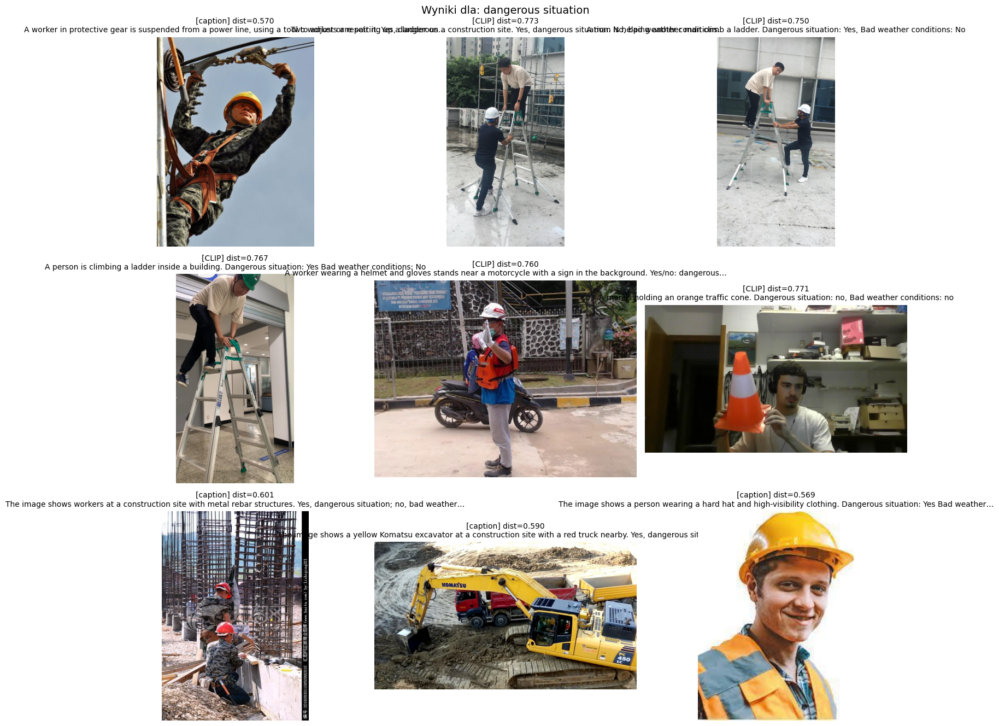

In [22]:
# ====== Wizualizacja: siatka obrazów z captionami ======
import math
from PIL import Image
import matplotlib.pyplot as plt
import textwrap

def show_results_grid(hits, cols=3, max_items=9, title="Wyniki wyszukiwania"):
    items = hits[:max_items]
    if not items:
        print("Brak wyników do wyświetlenia.")
        return

    rows = math.ceil(len(items) / cols)
    plt.figure(figsize=(5*cols, 4.5*rows))
    for i, h in enumerate(items, 1):
        ax = plt.subplot(rows, cols, i)
        try:
            img = Image.open(h["path"]).convert("RGB")
            ax.imshow(img)
        except Exception as e:
            ax.text(0.5, 0.5, f"Błąd wczytywania:\n{e}", ha="center", va="center")
        ax.axis("off")

        # Zbuduj podpis: źródło + dystans + skrócony caption
        cap = h.get("caption") or ""
        cap = " ".join(cap.split())
        cap = textwrap.shorten(cap, width=120, placeholder="…")
        subtitle = f"[{h['source']}] dist={h['dist']:.3f}\n{cap}"
        ax.set_title(subtitle, fontsize=10)

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

show_results_grid(
    fused_hits,
    cols=3,
    max_items=9,
    title=f"Wyniki dla: {user_query}"
)


In [6]:
print("Texts:", col_text.count(), " | Images:", col_image.count())


Texts: 45  | Images: 43


In [24]:
print("\nTEXT hits:")
for i,(hid,meta,doc,dist) in enumerate(zip(res_txt["ids"][0],res_txt["metadatas"][0],res_txt["documents"][0],res_txt["distances"][0]),1):
    print(f"{i}. {hid} dist={dist:.3f} -> {meta.get('path','')}")

print("\nIMAGE hits:")
for i,(hid,meta,doc,dist) in enumerate(zip(res_img["ids"][0],res_img["metadatas"][0],res_img["documents"][0],res_img["distances"][0]),1):
    print(f"{i}. {hid} dist={dist:.3f} -> {meta.get('path','')}")



TEXT hits:
1. text::9a89390e8c25d7b0848f552faaead0e37bd6a2ad9657c03cc88e7821e2414478 dist=0.290 -> data\texts\faq_1.txt
2. caption::ezgif-frame-049_jpg.rf.5f3c4f3a0d783b825bb0cf16dfc074f0.jpg dist=0.326 -> data\images\train\ezgif-frame-049_jpg.rf.5f3c4f3a0d783b825bb0cf16dfc074f0.jpg
3. caption::cat.jpg dist=0.353 -> data\images\train\cat.jpg
4. caption::youtube-829_jpg.rf.66d152eed61344e0f7df6bcae6aa3265.jpg dist=0.354 -> data\images\train\youtube-829_jpg.rf.66d152eed61344e0f7df6bcae6aa3265.jpg

IMAGE hits:
1. image::98c7f2925e5d3f5072f4aeed7cd5b8b9e16a16bd19498e8a9e2ed36e24a14e50 dist=0.762 -> data\images\train\youtube-731_jpg.rf.838c1a531de2adae1392062b4b2bda66.jpg
2. image::e11e706d5fb4a9c7080b4a7891b654a2cc3779f142459ea3bad37c9a3849cf34 dist=0.762 -> data\images\train\class1_199_jpg.rf.50a1c4258718bea88141de349bdcd660.jpg
3. image::a77a21724a7e9da18a940b31ed411461f7ae1ad2adc7b3bf4d241d17a29be4f8 dist=0.762 -> data\images\train\youtube-639_jpg.rf.47e064afd133efd4c6791984efff39fc.jp

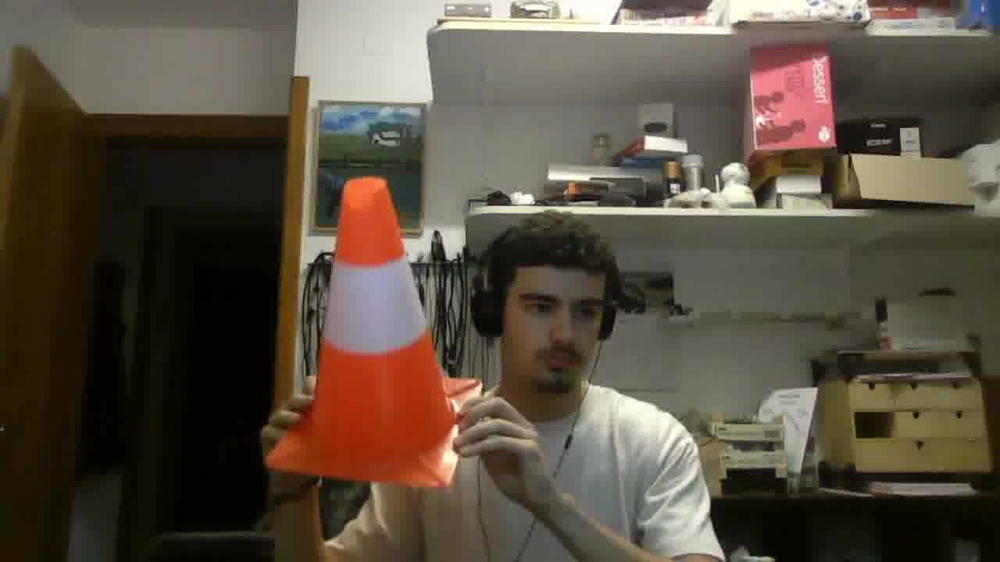

In [25]:
from PIL import Image
path= 'data/images/train/ezgif-frame-049_jpg.rf.5f3c4f3a0d783b825bb0cf16dfc074f0.jpg'
display(Image.open(path))

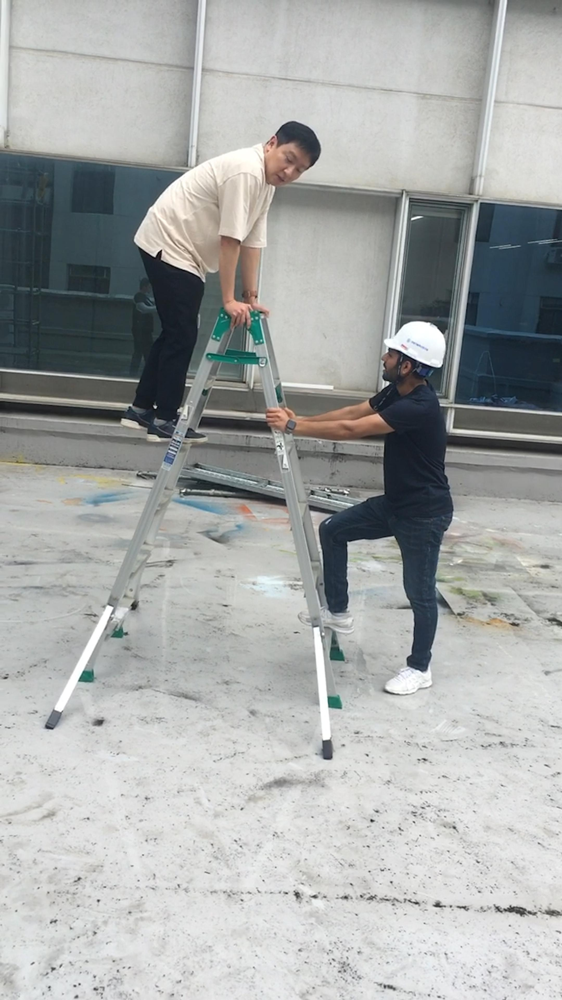

In [11]:
from PIL import Image
if res_img["ids"] and res_img["metadatas"][0]:
    test_path = res_img["metadatas"][0][0]["path"]
    display(Image.open(test_path))


In [8]:
# Qwen2.5-VL-3B-Instruct: generacja z kontekstem (PL)
from transformers import AutoProcessor, AutoModelForVision2Seq
from PIL import Image

model_id = "Qwen/Qwen2.5-VL-3B-Instruct"
processor = AutoProcessor.from_pretrained(model_id)
vlm = AutoModelForVision2Seq.from_pretrained(
    model_id,
    torch_dtype="auto",
    device_map="auto",
    load_in_8bit=True # Load the model in 8-bit precision to save memory
)

# weź top-1 obraz i 1–2 fragmenty tekstowe z wcześniej policzonych res_img / res_txt
image_path = res_img["metadatas"][0][0]["path"] if res_img["ids"] else None
image_for_vlm = Image.open(image_path).convert("RGB") if image_path else None

context_snippets = []
if res_txt["ids"]:
    for doc in res_txt["documents"][0][:2]:
        context_snippets.append(doc[:400])

context_text = "Kontekst:\n" + "\n---\n".join(context_snippets) if context_snippets else "Brak kontekstu tekstowego."

prompt = (
    "Na podstawie kontekstu i obrazu odpowiedz po polsku. "
    "Najpierw w 1–2 zdaniach opisz obraz, potem streść wiedzę o kotach z kontekstu. "
    f"\n\n{context_text}\n"
)

if image_for_vlm:
    inputs = processor(text=prompt, images=[image_for_vlm], return_tensors="pt").to(vlm.device)
else:
    inputs = processor(text=prompt, return_tensors="pt").to(vlm.device)

out = vlm.generate(**inputs, max_new_tokens=220)
ans = processor.batch_decode(out, skip_special_tokens=True)[0]
print(ans)

The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.
Loading checkpoint shards: 100%|██████████| 2/2 [00:08<00:00,  4.01s/it]
g:\Users\alkai\anaconda3\envs\Multimodal_RAG\lib\site-packages\bitsandbytes\autograd\_functions.py:186: UserWarning: MatMul8bitLt: inputs will be cast from torch.bfloat16 to float16 during quantization
  warnings.warn(f"MatMul8bitLt: inputs will be cast from {A.dtype} to float16 during quantization")


ValueError: Image features and image tokens do not match: tokens: 0, features 10549

In [15]:
from transformers import AutoProcessor, AutoModelForVision2Seq

# ====== Przygotowanie kontekstu do generacji ======
# Złóż krótki kontekst tekstowy + (opcjonalnie) jeden obraz dla VLM
context_snippets = []
image_for_vlm = None
for hid, meta, doc, dist in hits:
    if meta["type"] == "text":
        context_snippets.append(doc[:400])
    elif meta["type"] == "image" and image_for_vlm is None:
        try:
            image_for_vlm = Image.open(meta["path"]).convert("RGB")
        except Exception:
            image_for_vlm = None

context_text = "Kontekst (z retrieval):\n" + "\n---\n".join(context_snippets[:2]) if context_snippets else "Brak kontekstu tekstowego."

prompt = (
    "Na podstawie kontekstu i, jeśli dostępny, obrazu: \n"
    f"{context_text}\n\n"
    "Odpowiedz po polsku: streść wiedzę osrodkach bezpieczenstwa na budowie, co jest na obrazie."
)

# ====== Qwen2.5-VL-3B-Instruct (VLM) ======
model_id = "Qwen/Qwen2.5-VL-3B-Instruct"
processor = AutoProcessor.from_pretrained(model_id)
vlm = AutoModelForVision2Seq.from_pretrained(
    model_id,
    torch_dtype="auto",
    device_map="auto"
)

def generate_with_qwen_vl(prompt, image=None, max_new_tokens=200):
    if image is not None:
        inputs = processor(text=prompt, images=[image], return_tensors="pt").to(vlm.device)
    else:
        inputs = processor(text=prompt, return_tensors="pt").to(vlm.device)

    out = vlm.generate(**inputs, max_new_tokens=max_new_tokens)
    text = processor.batch_decode(out, skip_special_tokens=True)[0]
    return text

answer = generate_with_qwen_vl(prompt, image=image_for_vlm)
print("\n=== MODEL ANSWER ===\n")
print(answer)


Loading checkpoint shards: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


ValueError: Image features and image tokens do not match: tokens: 0, features 10549

**Backup**
